# An Introduction to Social Data Science

## Lecture Three

### An Introduction to Key SDS Libraries

#### 11th August, 2021

### 3.0 Introduction

Welcome! In yesterday's class we finished our brief introduction to the basics of Python, where we finished learning about writing our own custom functions and other types of advanced control statements. In this class, we'll begin our journey into Social Data Science (SDS) proper, and look begin to look at a number of key libraries used for SDS. As in the earlier classes, we're going to structure our sections quite specifically, beginning first with a review of yesterday's homework, proceed with content and have some exercises and breaks, more new content before we conclude with a discussion of the next homework. Specifically, today we're going to learn about:

        3.1 An Introduction to NumPy.
        3.2 An Introduction to pandas.
        3.3 An Introduction to Matplotlib.
        3.4 An introduction to requests.
        3.5 An introduction to speccurve.

In later lectures we're going to specifically and in a more dedicated fashion learn about [scikitlearn](https://scikit-learn.org/), [gensim](https://radimrehurek.com/gensim/) and [network-x](https://networkx.org).

All of the lectures today come bundled with the Anaconda distribution of Python 3.x, which we discussed installing in Lecture 1 and the course readme.md file.

### 3.1 [NumPy](https://numpy.org/) and [Scipy](https://www.scipy.org/)

We're first going to walk through a heavily synthesised version of the excellent [quickstart](https://numpy.org/doc/stable/user/quickstart.html) guide for NumPy. As with all of the sections in this notebook, they're tailed to a SDS perspective.

#### 3.1.1 The very basic bones of NumPy

We can first begin by loading numpy, assigning it to its most common abbreviation of `np` which you'll see in lots of SO posts, and other tutorials:

In [1]:
import numpy as np

NumPy’s main object is the homogeneous multidimensional array. It is like a table of elements (usually numbers), which could all be of the same type, indexed by a tuple of non-negative integers. In NumPy, dimensions are called axes. Lets consider co-ordinates in 3-dimensional space; `[1, 5, 1]`. This has one axis, and three elements to it.  How many axes does the following example have? What are their lengths?

In [2]:
[[1., 2., 3.],
 [4., 5., 6.]]

[[1.0, 2.0, 3.0], [4.0, 5.0, 6.0]]

That's right! It has two axes, the first of which is length two, and the second of which is length three. What about another one?

In [3]:
[[1., 2., 3., 4.],
 [5., 6., 7., 8.],
 [9., 10., 11., 12.],
 [13., 14., 15., 16.]]

[[1.0, 2.0, 3.0, 4.0],
 [5.0, 6.0, 7.0, 8.0],
 [9.0, 10.0, 11.0, 12.0],
 [13.0, 14.0, 15.0, 16.0]]

Yes indeed, it has two axes, each with length of four! NumPy’s array class is called `ndarray`. Lets now quickly look at some examples of the most important _attributes_ of the `ndarray` object. Let us first define an array with 15 elements, split into two axes of length 3 and 5:


In [4]:
a = np.arange(15).reshape(3, 5)
a

array([[ 0,  1,  2,  3,  4],
       [ 5,  6,  7,  8,  9],
       [10, 11, 12, 13, 14]])

We can check the shape of this object, which will be a tuple of integers indicating the size of the array in each dimension. For a matrix with _n_ rows and _m_ columns, the shape will be (n,m):

In [5]:
a.shape

(3, 5)

We can use the common `.dtype` method to describe the type of elements in the array:

In [6]:
a.dtype.name

'int64'

And we can retrieve the number of elements in our array:

In [7]:
a.size

15

Let us just quickly see the difference between 1d, 2d, and 3d arrays:

In [8]:
a = np.arange(6)                    # 1d array
a

array([0, 1, 2, 3, 4, 5])

In [9]:
b = np.arange(12).reshape(4, 3)     # 2d array
b

array([[ 0,  1,  2],
       [ 3,  4,  5],
       [ 6,  7,  8],
       [ 9, 10, 11]])

In [10]:
c = np.arange(24).reshape(2, 3, 4)  # 3d array
c

array([[[ 0,  1,  2,  3],
        [ 4,  5,  6,  7],
        [ 8,  9, 10, 11]],

       [[12, 13, 14, 15],
        [16, 17, 18, 19],
        [20, 21, 22, 23]]])

This understanding of dimensionality is really important when we come to data analysis (at least, outside of flat `pandas` DataFrames (see Section 3.2), and with specific relevance to 3-Dimensional `Matplotlib` visualisations).

#### 3.1.2 Creating arrays

We've already seen a one (`np.arange()`) and alluded to another way to make `ndarray()` objects (where we were using lists in our above example). Lets see thisd way of creating an array from a list or tuple more concretely:

In [11]:
b = np.array([1.2, 3.5, 5.1])

What is the `.dtype` of `b`? Note, a frequent error of defining an array is:

In [12]:
import traceback
try:
    np.array(1.2, 3.5, 5.1)
except:
    traceback.print_exc()

Traceback (most recent call last):
  File "<ipython-input-12-4d66c67b4ccb>", line 3, in <module>
    np.array(1.2, 3.5, 5.1)
TypeError: array() takes from 1 to 2 positional arguments but 3 were given


What's gone wrong here? Note, we can also specify the `dtype` in advance, for example, if we wanted complex numbers:


In [13]:
c = np.array([[1, 2], [3, 4]], dtype=complex)
c

array([[1.+0.j, 2.+0.j],
       [3.+0.j, 4.+0.j]])

We very commonly know the size of an array we want, but just not what's going to go into it in advance. This becomes _really_ important when we are doing things like simulations, or other types of algorithmic design which create specific outputs which should be directed to certain places, and we know how many to expect, but just not what the values will be. Imporatntly growing or appending arrays on the fly is extremely (and indeed often prohibitively) computationally expensive. NumPy offers functions to create empty arrays, either full of zeros, or full of ones (or empty arrays, not shown here, but left for further exploration):

In [14]:
np.zeros((3, 4))

array([[0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.]])

In [15]:
np.ones((2, 3, 4))

array([[[1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.]],

       [[1., 1., 1., 1.],
        [1., 1., 1., 1.],
        [1., 1., 1., 1.]]])

To recap from above; the second cell above here inputs a tuple which has given us a 3d array, with axes of length 2, 3 and 4 (and then filled this in with 1.0s, as the default `dtype` is `np.float64`, which can be changed).

#### 3.1.3 Basic Operations

We've already seen how to undertake basic operations in pure python in Lectures 1 and 2. NumPy offers _far_ more flexibility. Arithmetic operators on arrays apply elementwise. Lets see some examples:

In [16]:
a = np.array([20, 30, 40, 50])
b = np.arange(4)
c = a-b
c

array([20, 29, 38, 47])

We can also make boolean checks:

In [17]:
a < 35

array([ True,  True, False, False])

The product operator `*` operates elementwise in NumPy arrays:

In [18]:
A = np.array([[1, 1],
              [0, 1]])
B = np.array([[2, 0],
              [3, 4]])
A*B

array([[2, 0],
       [0, 4]])

The matrix product can be performed using the `@` operator:

In [19]:
A@B

array([[5, 4],
       [3, 4]])

Some operations act to modify an existing array on the fly, as opposed to creating a new one (but we leave issues pertaining to views, copies and 'deep' copies for further study):

In [20]:
a = np.ones((2, 3), dtype=int)
a *= 3
a

array([[3, 3, 3],
       [3, 3, 3]])

When we have arrays of different types, the `dtype` of the output array is [upcast](https://stackoverflow.com/questions/12472097/what-is-upcast) to the more precise one:

In [21]:
a = np.ones(3, dtype=np.int32)
b = np.linspace(0, np.pi, 3)
c = a + b

In [22]:
c.dtype.name

'float64'

By default, elementwise operations apply as if the array were a list of numbers (as opposed to a matrix with rows and columns). However, the axis parameter can apply to specific axes:

In [23]:
b = np.arange(12).reshape(3, 4)
b.sum(axis=0)     # sum of each column

array([12, 15, 18, 21])

In [24]:
b.min(axis=1)     # min of each row

array([0, 4, 8])

NumPy also has a range of 'Universal Functions' which operate elementwise on an array, producing an array as output. For example, the logarithm of each element:

In [25]:
B = np.arange(3)
np.log(B+1)

array([0.        , 0.69314718, 1.09861229])

Or, for example, the square root:

In [26]:
np.sqrt(B)

array([0.        , 1.        , 1.41421356])

Or just a simple addition (noticing the chain):

In [27]:
np.add(B, np.array([2., -1., 4.]))

array([2., 0., 6.])

#### 3.1.4 Indexing and Slicing

One-dimensional arrays can be indexed, sliced and iterated over, much like lists and other Python sequences just like we learnt in Lectures One and Two. This is extremely important when it comes to data analysis, and something which we're going to extensively revisit in both 3.2 and later Lectures when it comes to subsetting data.

In [28]:
a = np.arange(10)**2
a[2]

4

In [29]:
a[2:5]

array([ 4,  9, 16])

In [30]:
a[:6:2] = 1000 # from 0 to 6, set every 2nd element to 1000
a

array([1000,    1, 1000,    9, 1000,   25,   36,   49,   64,   81])

Multidimensional arrays can have one index per axis:

In [31]:
b = np.arange(9).reshape(3, 3)
b[1, 2]

5

And we can slice for, for example, each row in the second columb of `b`:

In [32]:
b[:, 1]

array([1, 4, 7])

**Iterating** over an array by default is done with respect to the first axis:

In [33]:
for row in b:
 print(row)

[0 1 2]
[3 4 5]
[6 7 8]


But we can also use the `flat` attribute to loop over every individual element (and, for example, slice on that):

In [34]:
for element in b.flat[0:5]:
    print(element)

0
1
2
3
4


#### 3.1.5 Reshaping an array

Remember that an array has a shape determined by the number of elements along each axis (and can be checked with `ndarray.shape`). The shape can be changed in various ways. For example:

In [35]:
a = np.arange(16)
a.ravel()  # returns the array, flattened

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15])

In [36]:
a.reshape(8, 2) # returns the array with a modified shape

array([[ 0,  1],
       [ 2,  3],
       [ 4,  5],
       [ 6,  7],
       [ 8,  9],
       [10, 11],
       [12, 13],
       [14, 15]])

In [37]:
a.T  # Transposes

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15])

... and many more. We can also stack together different arrays, for example, vertically:

In [38]:
a = np.arange(4).reshape(2, 2)
b = np.arange(8).reshape(4, 2)
np.vstack((a, b))

array([[0, 1],
       [2, 3],
       [0, 1],
       [2, 3],
       [4, 5],
       [6, 7]])

and also (after a quick reshape) horizontally:

In [39]:
b = np.arange(8).reshape(2, 4)
np.hstack((a, b))

array([[0, 1, 0, 1, 2, 3],
       [2, 3, 4, 5, 6, 7]])

We can also split one array into multiple either horizontally (using `hsplit`) or vertically (using `vsplit`):

In [40]:
a = np.arange(18).reshape(2,9)
np.hsplit(a, 3)                     # Split `a` into 3 horizontally

[array([[ 0,  1,  2],
        [ 9, 10, 11]]),
 array([[ 3,  4,  5],
        [12, 13, 14]]),
 array([[ 6,  7,  8],
        [15, 16, 17]])]

In [41]:
np.vsplit(a, 2)                     # Split `a` into 2 vertically

[array([[0, 1, 2, 3, 4, 5, 6, 7, 8]]),
 array([[ 9, 10, 11, 12, 13, 14, 15, 16, 17]])]

#### 3.1.5 Exercise and Break

Phew! That was a lot to cover. Lets set you something to think about while we take a ten-minute break:

``` Define an array which is shaped (5,2) with any positive numbers inside it. Add 2 to each element. Flatten the array. Take the logarithm of each element using a Universal Function, and print each element out in a loop
```

The solution for this exercise will go onto GitHub after this class.

### 3.2 Pandas

#### 3.2.0 Introduction

[pandas](https://pandas.pydata.org/) is a fast, powerful, flexible and easy to use open source data analysis and manipulation tool. It allows us to move into more familiar 'flat-file' territory akin to a spreadsheet or (or DataTable in `R`). It comes with Anaconda. If offers just so much funcionality for all SDS, and importantly, allows us to read in datasets into a tractible and easily manipulable format for data analysis (via `pd.read_csv()`, covered last). First, like above with `import numpy as np`, we want to do something like (most commonly) `import pandas as pd`:

In [42]:
import pandas as pd

#### 3.2.1. Basic Structures

Lets first see the most basic type of Data Structure: a `Series`. We're going to pass in a list of values, and let pandas create a default index:

In [43]:
s = pd.Series([1, 2, 3, np.nan, 5])
s

0    1.0
1    2.0
2    3.0
3    NaN
4    5.0
dtype: float64

A `Series` most commonly represents a 'column' in a `DataFrame` (a separate type of object, which has two axes: rows and columns). In the above example, our row index was `[0,1,2,3,4]`. Using the NumPy random number generator (`np.random.randn()`), lets create a DataFrame which has dimensions 2 by 4. Note that we can :

In [44]:
df = pd.DataFrame(np.random.randn(2, 4), index=[0,1], columns=list("ABCD"))
df#%%

,A,B,C,D
0,-1.086580,0.132550,0.298182,1.481176
1,-0.230915,1.340451,0.116442,0.528920


Note, we could also have specified the column headers as ['A', 'B', 'C', 'D']:

In [45]:
df = pd.DataFrame(np.random.randn(2, 4), index=[0,1], columns=['A', 'B', 'C', 'D'])
df

,A,B,C,D
0,0.309160,1.268532,-0.038793,0.841344
1,-0.554692,-0.244469,-0.023053,0.783185


(Pop quiz: Why are the numbers different in these two cells? Why do they change every time we run those cells?)

We can also create a DataFrame by passing a dictionary:

In [46]:
df2 = pd.DataFrame(
    {
        "A": 1.0,
        "B": [123,456,789,123],
        "C": pd.Series(10, index=list(range(4)), dtype="float32"),
    }
)
df2

,A,B,C
0,1.0,123,10.0
1,1.0,456,10.0
2,1.0,789,10.0
3,1.0,123,10.0


Can you work out exactly whats happening above? Each of the keys represents a column name, and the values are the row-entries for those columns. Columns of dataframes have different `dtypes` (of which there are several (including dates, times, strings, and so forth):

In [47]:
df2.dtypes

A    float64
B      int64
C    float32
dtype: object

Just with other languages, we can look at the `head()` and `tail()` of our `Series` and `DataFrame` objects:

In [48]:
df2.head(2)

,A,B,C
0,1.0,123,10.0
1,1.0,456,10.0


In [49]:
df2.tail(2)

,A,B,C
2,1.0,789,10.0
3,1.0,123,10.0


and see the (row axis) index:

In [50]:
df2.index

Int64Index([0, 1, 2, 3], dtype='int64')

and the columns:

In [51]:
df2.columns

Index(['A', 'B', 'C'], dtype='object')

We can also do a quick conversion of our DataFrame to a numpy array:

In [52]:
df2.to_numpy()

array([[  1., 123.,  10.],
       [  1., 456.,  10.],
       [  1., 789.,  10.],
       [  1., 123.,  10.]])

We can obtain some simple summary statistics about our dataframe with the `describe()` function:

In [53]:
df2.describe()

,A,B,C
count,4.0,4.000000,4.0
mean,1.0,372.750000,10.0
std,0.0,318.823227,0.0
min,1.0,123.000000,10.0
25%,1.0,123.000000,10.0
50%,1.0,289.500000,10.0
75%,1.0,539.250000,10.0
max,1.0,789.000000,10.0


We can also transpose our `DataFrame` with `.T`:

In [54]:
df2.T

,0,1,2,3
A,1.0,1.0,1.0,1.0
B,123.0,456.0,789.0,123.0
C,10.0,10.0,10.0,10.0


and sort values, unsurprisingly, with `sort_values()` (which is extremely, extremely useful):

In [55]:
df2.sort_values(by='B', ascending=False)

,A,B,C
2,1.0,789,10.0
1,1.0,456,10.0
0,1.0,123,10.0
3,1.0,123,10.0


#### 3.2.2 Selecting and Indexing

We can select a single `Series` from this `DataFrame` object for further analysis:

In [56]:
df2['B']

0    123
1    456
2    789
3    123
Name: B, dtype: int64

Note that here we're slicing on the column index. We can also slice on the row index:

In [57]:
df2[0:1]

,A,B,C
0,1.0,123,10.0


Note the exclusive (left-inclusive, right-exclusive) indexing here. For getting a scalar value:

In [58]:
df2.at[0, "B"]

123

Similar to NumPy, we can index on integer positions using `.iloc`:

In [59]:
df.iloc[0:1, 0:2]

,A,B
0,0.30916,1.268532


Here we've sliced on the first row, and the first two columns. We could have sliced on columns explicitly:

In [60]:
df2.iloc[:, 1:3]

,B,C
0,123,10.0
1,456,10.0
2,789,10.0
3,123,10.0


We can also do what's called 'Boolean Indexing', which means to subset on an index with specific regard as to whether a value is `True` or `False`. This is _extremely_ useful when it comes to social data analysis, when we want to do things like subsetting on Males or Females, or people above a certain age. Lets subset on `df2` with specific regards to whether the values in our `B` column are above `200`:

In [61]:
df2[df2["B"] > 200]

,A,B,C
1,1.0,456,10.0
2,1.0,789,10.0


Note that here we've dropped the two rows of column `B` when its less than 200, i.e. our two `123` values. We can also assign new columns to a DataFrame:

In [62]:
df2['D'] = df2['B']*2
df2

,A,B,C,D
0,1.0,123,10.0,246
1,1.0,456,10.0,912
2,1.0,789,10.0,1578
3,1.0,123,10.0,246


Note here we are ignoring everything to do with ('deep') copies, which is left for further study (not to say that it isnt important)! We can also use a `where` like operation (without explicitly considering an `np.where()` type of operation). For example, where all values `df2` are less than 200, lets set them to `np.nan()` (more about this object type momentarily).

In [63]:
df2[df2 < 200] = np.nan
df2

,A,B,C,D
0,NaN,NaN,NaN,246
1,NaN,456.0,NaN,912
2,NaN,789.0,NaN,1578
3,NaN,NaN,NaN,246


As a quick aside, note that `pandas` primarily uses the value `np.nan` to represent missing data.

#### 3.2.4. Operations

Operations in general exclude missing data, but allow us to do things like calculate descriptive statistics, like the `mean()`:

In [64]:
df2.mean()

A      NaN
B    622.5
C      NaN
D    745.5
dtype: float64

Until now, we've only been really talking about floats and integers. There are also a range of useful string methods associated with `pd.Series()` objects, such as `pd.Series.str.lower()` (note that there are a lot of similar methods here):

In [65]:
a = pd.Series(["A", "B", "C", "Aaba", "Baca", np.nan, "CABA", "dog", "cat"])
a.str.lower()

0       a
1       b
2       c
3    aaba
4    baca
5     NaN
6    caba
7     dog
8     cat
dtype: object

#### 3.2.5. Merging

With specific regards to SDS, one of the most important things is to be able to merge or concatenate datsets together (for example: different survey datasets). `pandas` offers _excellent_ funcionality for this, similar in many ways to standard database. There are different types of merging. They're _so important_ for SDS that they each get their own sub-sub-sub-section.

##### 3.2.5.1 Concatenations

First of all, we can concatenate pandas objects together with concat(). Lets first make a couple of new dataframes:

In [66]:
df3 = pd.DataFrame(np.random.randn(2, 3))

In [67]:
df4 = pd.DataFrame(np.random.randn(2, 3))

And then concatenate them:

In [68]:
pd.concat([df3, df4])

,0,1,2
0,0.283699,-0.736281,-0.153660
1,-1.178828,-0.105731,0.566170
0,0.498934,-0.643229,1.187297
1,-1.151823,0.095847,-0.194901


Maybe here we'd want to do someting like `df.reset_index()`!

##### 3.2.5.2 Merges

We can also merge these dataframes as a standard SQL operation:

In [69]:
df5 = pd.DataFrame({"key": ["foo", "bar", "dee", "dar"], "left_value": [1, 2, 2, 3]})
df6 = pd.DataFrame({"key": ["foo", "bar", "dee", "dar"], "right_value": [3, 4, 5, 5]})
df5

,key,left_value
0,foo,1
1,bar,2
2,dee,2
3,dar,3


In [70]:
df6

,key,right_value
0,foo,3
1,bar,4
2,dee,5
3,dar,5


In [71]:
pd.merge(df5, df6, left_on="key", right_on="key", how='left')

,key,left_value,right_value
0,foo,1,3
1,bar,2,4
2,dee,2,5
3,dar,3,5


##### 3.2.5.3 Grouping

We can also 'group by' our data, which involves splitting the data into groups, applying a function to each group, and then outputs the results into an appropriate data structure. Lets see an example:

In [72]:
df = pd.DataFrame(
    {
        "A": ["foo", "bar", "foo", "bar", "foo", "bar", "foo", "foo"],
        "B": ["one", "one", "two", "three", "two", "two", "one", "three"],
        "C": np.random.randn(8),
        "D": np.random.randn(8),
        }
    )
df.groupby("A").sum()

,C,D
A,,
bar,-0.732377,0.870076
foo,-0.405404,-1.627413


##### 3.2.6 Data In and Out

Perhaps one of the most useful functions of pandas for SDS is the ability to save out and read in a wide variety of data formats. For example, lets save to .csv our most recent `df` object:

In [73]:
df.to_csv('Most_Recent_DF.csv')

And now, lets read this back in!

In [74]:
df_read = pd.read_csv('Most_Recent_DF.csv', index_col=0)
df_read

,A,B,C,D
0,foo,one,-0.332090,-1.355119
1,bar,one,-0.489271,0.275604
2,foo,two,0.264670,-1.701946
3,bar,three,-0.003152,1.030061
4,foo,two,-1.917878,1.461930
5,bar,two,-0.239954,-0.435589
6,foo,one,0.853836,-0.490548
7,foo,three,0.726058,0.458271


Note that pandas can read and save a _large_ number of different file formats.

##### 3.2.7 Other: Dates and Categoricals

It would be remiss to get this far without including two important use-cases/features of `pandas`: Categorical and Time-Series data.

In [75]:
df = pd.DataFrame(
    {"id": [1, 2, 3],
     "raw_grade": ["a", "b", "b"]}
    )
df["grade"] = df["raw_grade"].astype("category")
df["grade"]

0    a
1    b
2    b
Name: grade, dtype: category
Categories (2, object): ['a', 'b']

Getting a bit technical now for Time Series....:

In [76]:
rng = pd.date_range("3/6/2012 00:00", periods=5, freq="D")
pd.Series(np.random.randn(len(rng)), rng)

2012-03-06   -0.909979
2012-03-07    0.946273
2012-03-08    0.267282
2012-03-09   -0.685950
2012-03-10   -1.067928
Freq: D, dtype: float64

#### 3.2.8 Exercise and Break

Phew! That was a lot to cover. Lets set you something to think about while we take a ten-minute break:

```Load the two dataframes from the `data\` subdirectory of this lecture on GitHub. Concatenate them together, and take the groupby mean of all of the values for column 'Day'```

The solution for this exercise will go onto GitHub after this class.

#### 3.3.0 Matplotlib

Introducing [Matplotlib](): The greatest data-visualisation library of all time. Matplotlib has become the de facto standard for data visualization in Python since its initial release in 2003. Matplotlib is well-documented and supported by an active community. Here's a gallery of all the cool stuff it can do!

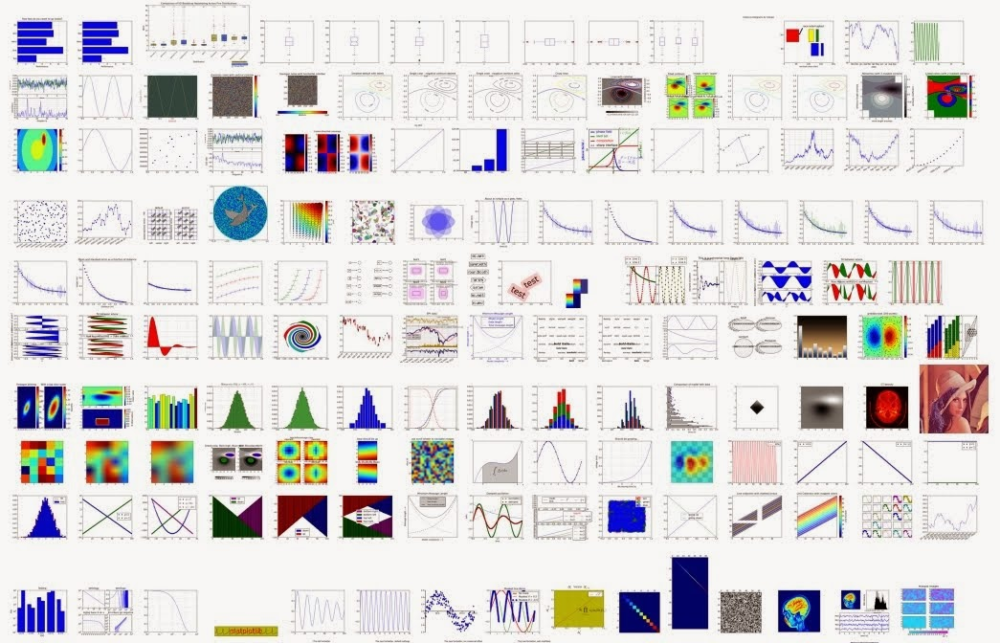

In [77]:
from IPython import display
display.Image("figures/matplotlib2.jpg")

And here's my favourite creation that I made for a paper entitled [Population Studies at 75 Years](https://osf.io/preprints/socarxiv/ehy3w/):

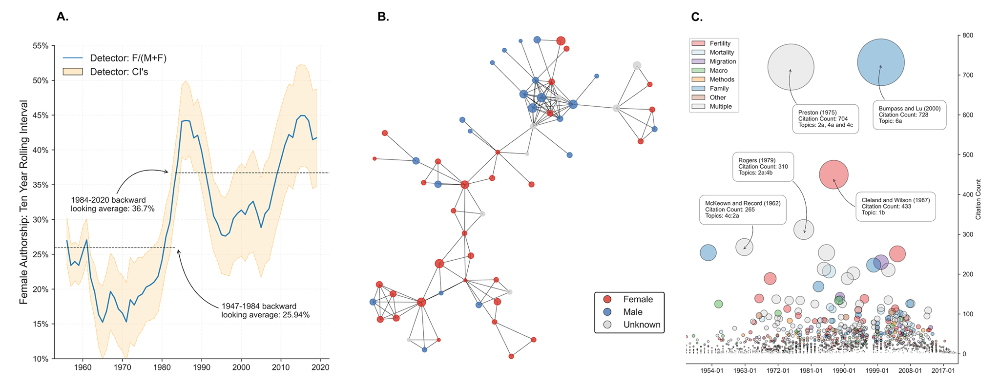

In [78]:
from IPython import display
display.Image("https://raw.githubusercontent.com/crahal/PopStudies_Review/master/assets/cover_picture.png")

Types of plot include:

    1.  Bar
    2.  Barh
    3.  Boxplot
    4.  Hist
    5.  hist2d
    6.  Pie
    7.  Plot
    8.  Polar
    9.  Scatter
    10.  Stackplot
    11.  Stem
    12.  Step
    13.  Quiver

To begin with, the Pyplot module from Matplotlib package is imported, with an alias plt as a matter of convention, with a "magic" statement to show plots inside Juypter Notebooks:

In [79]:
import matplotlib.pyplot as plt
%matplotlib inline

It would be remiss of me not to quickly mention this truly glorious "Anatomy of a Figure" (created in matplotlib) visualisation:

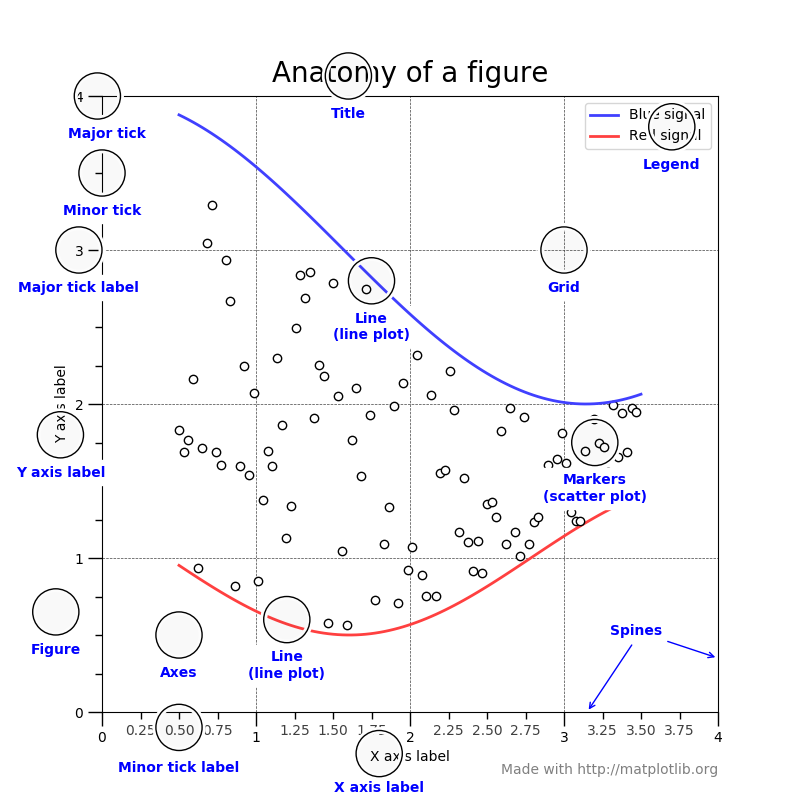

In [80]:
from IPython import display
display.Image("figures/anatomy_of_a_figure.png")

### 3.3.1 Our first figures

#### 3.3.1.1. Pypplot

Note quickly that there are two interfaces to Matplotlib. The first is a MATLAB-style pyplot interface which is simple and straightforward, but lacks flexibility:

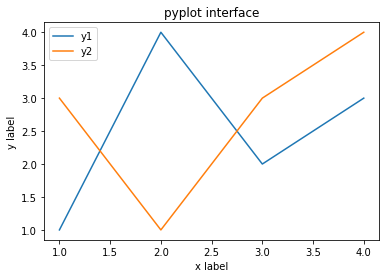

In [81]:
x = [1, 2, 3, 4]
y1 = [1, 4, 2, 3]
y2 = [3, 1, 3, 4]

plt.plot(x, y1, label='y1') # Plot x and y1
plt.plot(x, y2, label='y2') # Plot x and y2

plt.xlabel('x label') # Add an x-label
plt.ylabel('y label') # Add a y-label
plt.title("pyplot interface") # Add a title
plt.legend() # # Add a legend

#### 3.3.1.2. Object-Oriented (OO) Interface

However, we're going to put our attention onto the object-oriented (OO) interface, where users explicitly create figures ('fig') and axes ('ax'), and call methods on them to make plots. Most of the functions are also available in the matplotlib.axes.Axes class. This is where the fun begins!

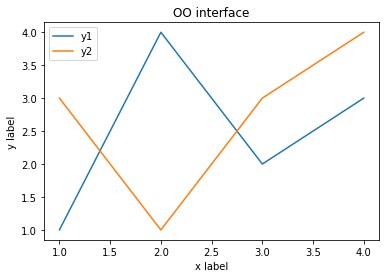

In [82]:
fig, ax = plt.subplots()  # Create a figure with one Axes.
ax.plot(x, y1, label='y1')  # Plot x and y1 on the Axes.
ax.plot(x, y2, label='y2')  # Plot x and y2 on the Axes.
ax.set_xlabel('x label')  # Add an x-label to the Axes.
ax.set_ylabel('y label')  # Add a y-label to the Axes.
ax.set_title("OO interface")  # Add a title to the Axes.
ax.legend()  # Add a legend to the Axes.

And with some NumPy arrays:

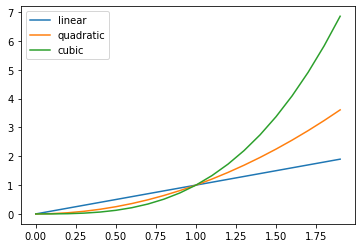

In [83]:
x = np.arange(0, 2, 0.1)
y1, y2, y3 = x, x**2, x**3

fig, ax = plt.subplots()
ax.plot(x, y1, label='linear')
ax.plot(x, y2, label='quadratic')
ax.plot(x, y3, label='cubic')
ax.legend()

#### 3.3.2 Pandas and Matplotlib

Here we use COVID-19 data downloaded from [Our World in Data](ourworldindata.org) on 5 Feb 2021 for demonstration

In [84]:
data = pd.read_csv("data/GBR_new_cases.csv") # Load data from CSV file
data # Inspect the content of data

,location,date,day,new_cases,new_cases_smoothed,new_deaths,new_deaths_smoothed
0,United Kingdom,2020-01-31,30,2.0,NaN,NaN,NaN
1,United Kingdom,2020-02-01,31,0.0,NaN,NaN,NaN
2,United Kingdom,2020-02-02,32,0.0,NaN,NaN,NaN
3,United Kingdom,2020-02-03,33,6.0,NaN,NaN,NaN
4,United Kingdom,2020-02-04,34,0.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...
367,United Kingdom,2021-02-01,397,18668.0,23821.429,407.0,1150.143
368,United Kingdom,2021-02-02,398,16906.0,23355.571,1451.0,1123.714
369,United Kingdom,2021-02-03,399,19215.0,22476.429,1322.0,1066.000
370,United Kingdom,2021-02-04,400,20734.0,21322.571,915.0,1019.714


Lets now make a plot of this data by directly accessing a specific column (Information on the number of new positive cases), and style a couple of the axis labels. We then save the plot out using the `savefig` command:

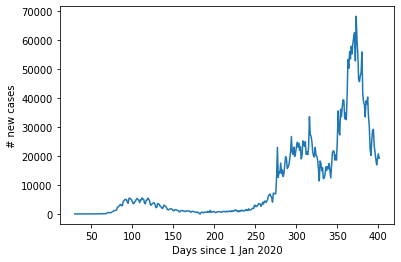

In [85]:
fig, ax = plt.subplots()
ax.plot(data['day'], data['new_cases']) # Columns can be accessed with square brackets
ax.set_xlabel("Days since 1 Jan 2020")
ax.set_ylabel("# new cases")
fig.savefig("figures/UK_new_cases.png", dpi=300)

Lets then load another dataset (on vaccination counts from OurWorldInData) and create a couple of series objects to make a barchart:

In [86]:
data = pd.read_csv("data/vaccination_progress.csv") # Load vaccination data from CSV file
country = data['location']
vac_rate = data['people_vaccinated'] / data['population'] # Calculate vaccination rate
data # Inspect data

,location,people_vaccinated,population,gdp_per_capita
0,France,1772602.0,65273512.0,38605.671
1,Germany,2162961.0,83783945.0,45229.245
2,Israel,3371068.0,8655541.0,33132.320
3,Italy,1386498.0,60461828.0,35220.084
4,United Kingdom,10971047.0,67886004.0,39753.244
5,United States,27905197.0,331002647.0,54225.446


And then the (horizontal) barchart itself:

Text(0.5, 0, 'Vaccination rate')

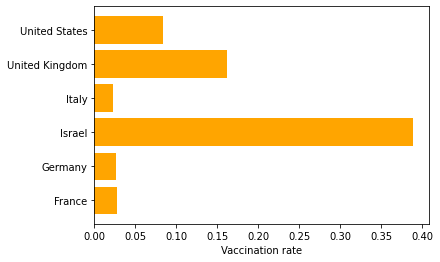

In [87]:
fig, ax = plt.subplots(figsize=(6,4))
ax.barh(country, vac_rate, color='orange') # # Make a horizontal bar plot
ax.set_xlabel("Vaccination rate") # Note y label becomes x label

We can also naturally build histograms:

Text(0, 0.5, 'Number of countries')

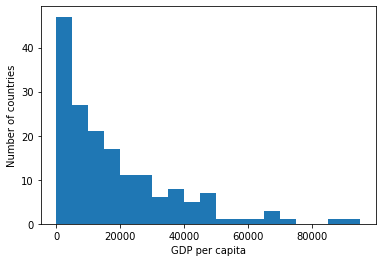

In [88]:
data = pd.read_csv("data/country_stats.csv")
fig, ax = plt.subplots()
bins = np.arange(0, 100e3, step=5e3) # 100e3 = 100,000; 5e3 = 5,000
ax.hist(data['gdp_per_capita'], bins)
ax.set_xlabel("GDP per capita")
ax.set_ylabel("Number of countries")

And histograms (from the same dataset):

Text(0, 0.5, 'COVID-19 death per million population')

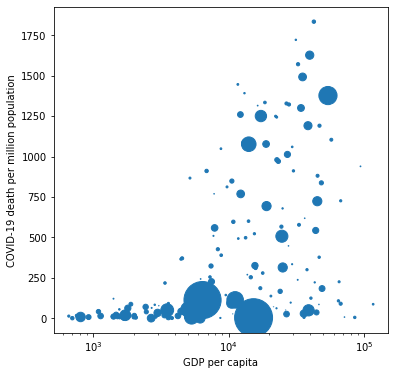

In [89]:
gdp = data['gdp_per_capita']
death_rate = data['total_deaths'] / data['population'] * 1e6 # Calculate deaths per million population
population = data['population'] / 1e9 # Population is represented in billions

fig, ax = plt.subplots(figsize=(6,6))
ax.scatter(gdp, death_rate, s=population * 1000, marker="o") # Marker size is proportional to population

ax.set_xscale('log') # Use log scale for x axis
ax.set_xlabel("GDP per capita")
ax.set_ylabel("COVID-19 death per million population")

Note here, we've set the xscale. Lets talk more specifically now about tailoring these plots.

#### 3.3.4 Customising plots

Lets have a very hands on example of a customised plot type, where we go line by line with inline comments:

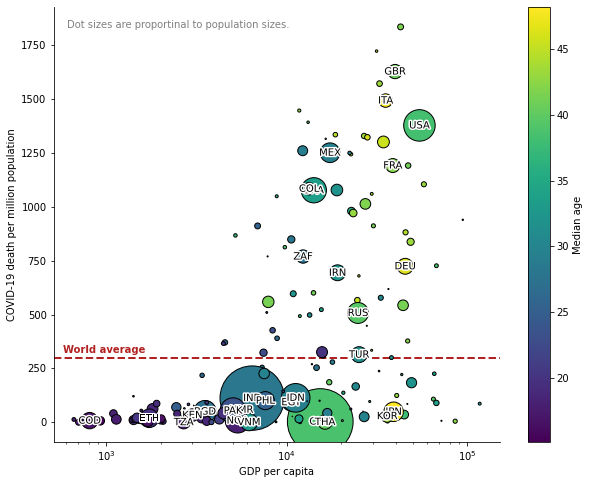

In [90]:
age = data['median_age']
# Calculate worldwide average death rate
mean_death_rate = sum(data['total_deaths']) / sum(data['population']) * 1e6

# Now set up the plot, just like before
fig, ax = plt.subplots(figsize=(10, 8))

# Note the additional options to the .scatter() command!
scatter_dots = ax.scatter(gdp, death_rate, s=population * 3000, c=age,
                          cmap="viridis", marker="o", edgecolor='k')

# We've seen this stuff above....
ax.set_xscale('log')
ax.set_xlabel("GDP per capita")
ax.set_ylabel("COVID-19 death per million population")

# Set up the colourbar so that we can style it
cb = fig.colorbar(scatter_dots, ax=ax)
cb.set_label("Median age")

# Add the note on the top pertaining to the 's=' option in ax.scatter()
ax.text(0.03, 0.97, 'Dot sizes are proportinal to population sizes.',
        color='gray', ha='left', va='top',
        transform=ax.transAxes)

#Annotate the dots with international ISO codes
import matplotlib.patheffects as path_effects
for i, g, d, p in zip(data['iso_code'], gdp, death_rate, population):
    if p >= 0.05:
        t = ax.text(g, d, i, ha='center', va='center')
        t.set_path_effects([path_effects.Stroke(linewidth=3, foreground='w'), path_effects.Normal()])

# Draw a horizontal line to denote average death rate
ax.axhline(mean_death_rate, linestyle='--', linewidth=2, color='firebrick', zorder=-1)

# Add a text label pertaining to this line
ax.text(0.02, mean_death_rate * 1.05, 'World average',
        color='firebrick', weight='bold', ha='left', va='bottom',
        transform=ax.get_yaxis_transform())

import seaborn as sns
sns.despine()

Looks pretty sharp. How about one last (time-series) example for us to test? I've made available a file in the `./data/` subdirectory pertaining to '% female authorship" over time from our 'Population Studies at 75 Years' paper (the file is called `gender_over_time.csv`). It should eventually look like this:

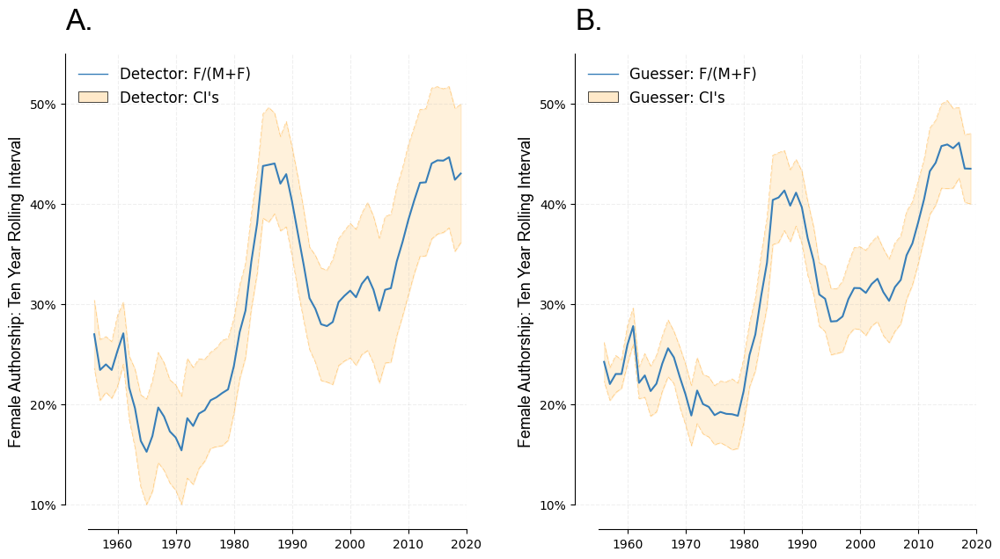

In [91]:
from IPython import display
display.Image("figures/gender_over_time.png")

Lets try get started, before I hand over to you:


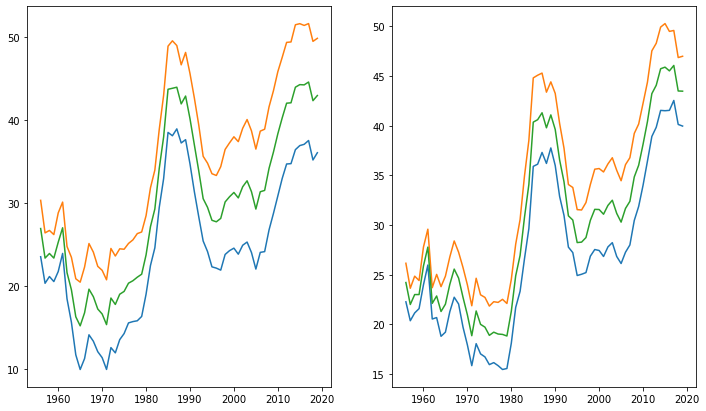

In [92]:
# first read in the dataframe:
gender_time_df = pd.read_csv("data/gender_over_time.csv", index_col=0)

# n.b.; what happens if we dont define the index column?

#define the OO interface:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 7))

#plot each line
ax1.plot(gender_time_df.index, gender_time_df['pc_detect_fem_10_lower'] * 100)
ax1.plot(gender_time_df.index, gender_time_df['pc_detect_fem_10_upper'] * 100)
ax1.plot(gender_time_df.index, gender_time_df['pc_detect_fem_10'] * 100)
ax2.plot(gender_time_df.index, gender_time_df['pc_guess_fem_10_lower'] * 100)
ax2.plot(gender_time_df.index, gender_time_df['pc_guess_fem_10_upper'] * 100)
ax2.plot(gender_time_df.index, gender_time_df['pc_guess_fem_10'] * 100)

#### 3.3.5 Exercise and Break

Lets now take a quick 10 minute break and do a quick exercise. How closely can you get this figure to match the one from the paper above? Solutions uploaded to GitHub shortly after this class.

### 3.4 Requests: HTTP for Humans

#### 3.4.0. Introducing Requests

The [Requests: HTTP for Humans](https://docs.python-requests.org/en/master/index.html) (known as `requests`) library is primarily used in SDS for two things; scraping raw .html pages, and for making requests from Application Programming Interfaces (APIs). An API is a connection between programs; A type of software interface, offering a service (i.e. data) to other pieces of software. You can use APIs to get access to data like weather information, sports scores, movie listings, tweets, search engine results, and pictures. We're mostly going to proceed with an introduction of the `requests` in this direction, and leave a page request of raw .html for our example exercise.

HTTP requests are how the web works. Every time you navigate to a web page, your browser makes multiple requests to the web page’s server. The server then responds with all the data necessary to render the page, and your browser then actually renders the page so you can see it.

The generic process is this: a client (like a browser or Python script using Requests) will send some data to a URL, and then the server located at the URL will read the data, decide what to do with it, and return a response to the client. Finally, the client can decide what to do with the data in the response.

Part of the data the client sends in a request is the request method. Some common request methods are GET, POST, and PUT. GET requests are normally for reading data only without making a change to something, while POST and PUT requests generally are for modifying data on the server.

#### 3.4.1 Our First Request

Lets first request a random quotation from the Zen Quotes [API](https://zenquotes.io/api/random). First, as always, we load our library:

In [93]:
import requests

We can see that the endpoint for this API is :

In [94]:
endpoint = 'https://zenquotes.io/api/random'

Note how we've defined this as string!

In [95]:
api_return = requests.get(endpoint)

Importantly, we can check the [status_code](https://blog.short.io/status-codes/) of this API call:

In [96]:
api_return.status_code

200

`200` informs about successful processing of the request. Maybe you're most familiar with `404 Not Found`.

Here’s a quick overview of what each status code means:

    1XX - Information
    2XX - Success
    3XX - Redirect
    4XX - Client Error (you made an error)
    5XX - Server Error (they made an error)


Lets see what this return actually looks like:

api_return.text

Most APIs return some type of .json (or xml). Lets make this object type a little bit more accessible by wrapping it into a json:

In [97]:
import json
json_return = json.loads(api_return.text)[0]
print('The quote: "' + json_return.get('q') + '"')
print('The author: "' + json_return.get('a') + '"')

The quote: "The scariest moment is always just before you start. After that, things can only get better."
The author: "Stephen King"


#### 3.4.2. Headers

Headers are sent along with the request and returned in the response. Headers are used so both the client and the server know how to interpret the data that is being sent and received in the response/response. We see the various headers that are returned:

In [98]:
print(api_return.headers)

{'Date': 'Wed, 07 Jul 2021 16:59:40 GMT', 'Server': 'Apache', 'Vary': 'Accept-Encoding', 'Content-Encoding': 'gzip', 'Content-Length': '176', 'Keep-Alive': 'timeout=5, max=100', 'Connection': 'Keep-Alive', 'Content-Type': 'text/plain; charset=utf-8'}


#### 3.4.3.1 Images

Lets see a slightly more advanced example, using images:

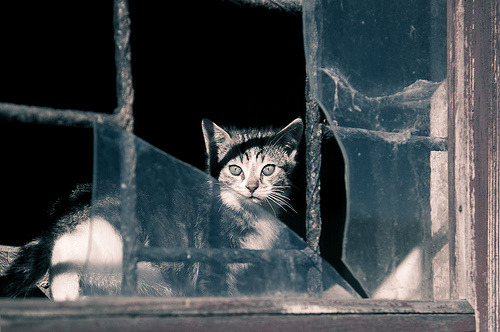

In [99]:
import io
import imageio
from PIL import Image

url = 'https://api.thecatapi.com/v1/images/search'

def get_cat(url):
    api_return = requests.get(url)
    if api_return.status_code==200:
        api_text = json.loads(api_return.text)
        cat_url = api_text[0]['url']
        r = requests.get(cat_url)
        return Image.open(io.BytesIO(r.content))
get_cat(url)

Can you figure out what's going on in this function here?'

#### 3.4.3.2 Takehome Exercise

Can you replicate a .gif such as this?

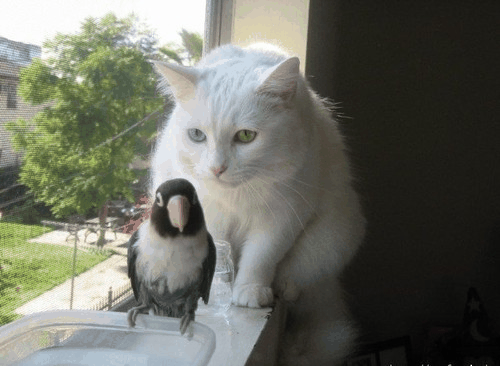

In [100]:
display.Image(open("figures/cats.gif",'rb').read())

#### 3.4.4 Raw HTML and Beautiful Soup

 HTML is primarily a way to present content to users visually, and not everything that you want to scrape has an API. Lets look now at an example of scraping raw HTML using the `requests` library, and a specific parsing library which excels at parsing (amongst other things like XML) HTML: [BeautifulSoup](https://beautiful-soup-4.readthedocs.io/en/latest/). We're going to specifically examine a fake Python jobs listing website specifically set up for the task of practicing webscraping: https://realpython.github.io/fake-jobs/. Lets import `bs4`, set the URL, call the page, and then parse it into a `soup` object;

In [101]:
from bs4 import BeautifulSoup

URL = "https://realpython.github.io/fake-jobs/"
page = requests.get(URL)

soup = BeautifulSoup(page.content, "html.parser")

~What we're essentially looking for is: something like:

```
<div id="ResultsContainer">
  <!-- all the job listings -->
</div>
```

And Beautiful Soup allows us to find that specific HTML element by its ID:

In [102]:
results = soup.find(id="ResultsContainer")
print(results.prettify()[0:1000])

<div class="columns is-multiline" id="ResultsContainer">
 <div class="column is-half">
  <div class="card">
   <div class="card-content">
    <div class="media">
     <div class="media-left">
      <figure class="image is-48x48">
       <img alt="Real Python Logo" src="https://files.realpython.com/media/real-python-logo-thumbnail.7f0db70c2ed2.jpg?__no_cf_polish=1"/>
      </figure>
     </div>
     <div class="media-content">
      <h2 class="title is-5">
       Senior Python Developer
      </h2>
      <h3 class="subtitle is-6 company">
       Payne, Roberts and Davis
      </h3>
     </div>
    </div>
    <div class="content">
     <p class="location">
      Stewartbury, AA
     </p>
     <p class="is-small has-text-grey">
      <time datetime="2021-04-08">
       2021-04-08
      </time>
     </p>
    </div>
    <footer class="card-footer">
     <a class="card-footer-item" href="https://www.realpython.com" target="_blank">
      Learn
     </a>
     <a class="card-footer-item" href=

You’ve seen that every job posting is wrapped in a `<div>` element with the class card-content. Now you can work with your new object called results and select only the job postings in it.

In [103]:
job_elements = results.find_all("div", class_="card-content")

Here, you call .find_all() on a Beautiful Soup object, which returns an iterable containing all the HTML for all the job listings displayed on that page. We then, within that `job_element` object, find all locations, get the text alone (with no further tags), and then strip out whitespace. Lets print the first ten job locations:

In [104]:
for job_element in job_elements[0:10]:
    print(job_element.find("p", class_="location").text.strip())

Stewartbury, AA
Christopherville, AA
Port Ericaburgh, AA
East Seanview, AP
North Jamieview, AP
Davidville, AP
South Christopher, AE
Port Jonathan, AE
Osbornetown, AE
Scotttown, AP


### 3.5 [statsmodels](https://www.statsmodels.org/stable/index.html)

We're now going to tie the majority of what we've learnt about above into a statistical example which uses numpy, pandas, matplotlib (under the hood) and introduces [specification_curve](https://pypi.org/project/specification-curve/). We are going to undertake a regression, and then examine our results to see how robust they are. This concept is known as '[the garden of forking paths](http://www.stat.columbia.edu/~gelman/research/unpublished/p_hacking.pdf)'.

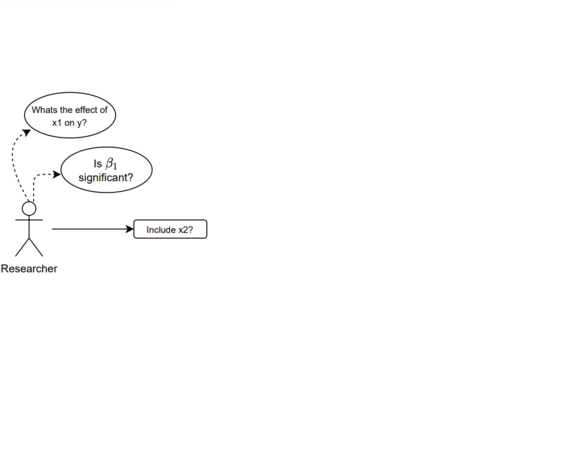

In [105]:
display.Image(open("figures/forking_paths.gif",'rb').read())

As always, lets load in our dependencies (be sure to `pip install specification_curve` first)

In [106]:
import statsmodels.api as sm
from specification_curve import specification_curve as specy

To make sure everything is reproducible, lets determine a definitive number of samples, and a [seed](https://en.wikipedia.org/wiki/Random_seed);

In [107]:
n_samples = 300
np.random.seed(1342)

Lets now define some random variables. The first three are all random floats in the half-open interval [0.0, 1.0).

In [108]:
x_1 = np.random.random(size=n_samples)
x_2 = np.random.random(size=n_samples)
x_3 = np.random.random(size=n_samples)

and the next two are dichotomous binary variables;

In [109]:
x_4 = np.random.randint(2, size=n_samples)
x_5 = np.random.randint(2, size=n_samples)


Lets define our y-variable to be a simple function of these, with a degree of noise;

In [110]:
y = (0.5*x_1 + 0.1*x_2 + 0.5*x_3 + x_4*0.6 + x_4*0.9 + x_5*0.4
     + 3*np.random.randn(n_samples))

Turn these into a dataframe, where the first list is our list of variables, and the second is our list of variable names;

In [111]:
df = pd.DataFrame([x_1, x_2, x_3, x_4, x_5, y],
                  ['x_1', 'x_2', 'x_3', 'x_4', 'x_5', 'y']).T

And then set the latter two variables (x4 and x_5) as categorical pandas columns;

In [112]:
df['x_4'] = df['x_4'].astype('category')
df['x_5'] = df['x_5'].astype('category')

If we ran a simple OLS model with x_1, x_2 and x_3, we might think that our x_1 variable is statistically significant!

In [113]:
X = df[['x_1', 'x_2', 'x_3']]
ols_reg1 = sm.OLS(df[['y']], X.astype(float)).fit()
ols_reg1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.210
Model:                            OLS   Adj. R-squared (uncentered):              0.202
Method:                 Least Squares   F-statistic:                              26.30
Date:                Wed, 07 Jul 2021   Prob (F-statistic):                    4.09e-15
Time:                        18:59:42   Log-Likelihood:                         -749.34
No. Observations:                 300   AIC:                                      1505.
Df Residuals:                     297   BIC:                                      1516.
Df Model:                           3                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x_1            1.3314      0.494      2.694      0.007       0.359       2.304
x_2            1.6684      0.467      3.573      0.000       0.750       2.587
x_3           -0.2838      0.491     -0.578      0.564      -1.250       0.683
==============================================================================
Omnibus:                        1.342   Durbin-Watson:                   2.040
Prob(Omnibus):                  0.511   Jarque-Bera (JB):                1.079
Skew:                          -0.124   Prob(JB):                        0.583
Kurtosis:                       3.157   Cond. No.                         3.19
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

But what about when we include x_4 and x_5?

In [114]:
X = df[['x_1', 'x_2', 'x_3', 'x_4', 'x_5']]
ols_reg2 = sm.OLS(df[['y']], X.astype(float)).fit()
ols_reg2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                      y   R-squared (uncentered):                   0.262
Model:                            OLS   Adj. R-squared (uncentered):              0.249
Method:                 Least Squares   F-statistic:                              20.92
Date:                Wed, 07 Jul 2021   Prob (F-statistic):                    6.83e-18
Time:                        18:59:42   Log-Likelihood:                         -739.16
No. Observations:                 300   AIC:                                      1488.
Df Residuals:                     295   BIC:                                      1507.
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
x_1            0.5475      0.511      1.071      0.285      -0.459       1.554
x_2            1.1525      0.473      2.438      0.015       0.222       2.083
x_3           -0.7013      0.489     -1.434      0.153      -1.664       0.261
x_4            1.3581      0.318      4.269      0.000       0.732       1.984
x_5            0.4174      0.321      1.299      0.195      -0.215       1.050
==============================================================================
Omnibus:                        1.054   Durbin-Watson:                   1.996
Prob(Omnibus):                  0.590   Jarque-Bera (JB):                0.796
Skew:                          -0.019   Prob(JB):                        0.672
Kurtosis:                       3.249   Cond. No.                         4.27
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

Introducing Specification Curve Analysis! A great way to visualise all combinations of variables. They can also be expanded to include things like deterministic variables, and transformation choices!

Fit complete


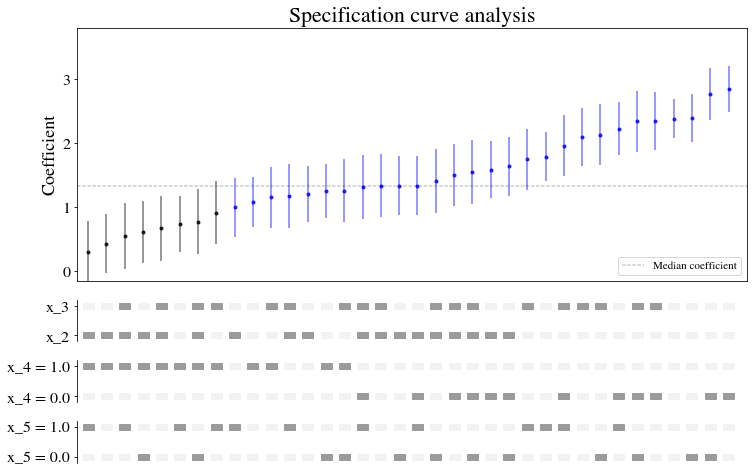

In [115]:
sc = specy.SpecificationCurve(df, 'y', 'x_1', ['x_2', 'x_3', 'x_4', 'x_5'],
                              cat_expand=['x_4', 'x_5'])
sc.fit()
sc.plot()

### 3.5. Homework

As always, we'll go through the solution to this homework in the next class!

#### 3.5.1.

(Basic): Can you scrape a page from [thepeerage](http://thepeerage.com/), and parse the biography of Prince Charles?

#### 3.5.2.

(Advanced):  What perecent of people on the first ten pages are males, and how many are females?


